# Geospatial Data Exploration

We are working on a Datacube containing images from a park area in Maine, USA. The Sentinel-2 satellite captured 23 pictures of the area during the period from April 9th, 2021, to November 25th, 2021. Usually these images are used for agricoultural activities, monitoring natural resources, cartography and more. The four bands represent four different intervals in the electromagnetic spectrum, those are aproximately blu 492 +/- 33 (nm), green 560 +/- 18 (nm), red 665 +/- 15 (nm), nir (infrared) 833 +/- 53 (nm). 

We are going to use these data for the calculation on the NDVI index (Normalized Difference Vegetation Index). 


In [59]:
# import libraries
import os
import xarray as xr
import numpy as np 
import pandas as pd
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import geopandas as gpd
from collections import Counter
from IPython.display import Image

## Loading data and first exploration

In [60]:
# load the Datacube
datacube = xr.open_dataset("geospatial_test_Datacube.nc")

# First visualization of the Datacube
print(datacube)

<xarray.Dataset> Size: 25MB
Dimensions:   (time: 23, y: 227, x: 304)
Coordinates:
  * time      (time) datetime64[ns] 184B 2021-04-09 2021-04-14 ... 2021-11-25
  * y         (y) float32 908B 45.23 45.23 45.23 45.23 ... 45.21 45.21 45.21
  * x         (x) float32 1kB -69.95 -69.95 -69.95 ... -69.92 -69.92 -69.92
Data variables:
    S2_RED    (time, y, x) float32 6MB ...
    S2_GREEN  (time, y, x) float32 6MB ...
    S2_BLUE   (time, y, x) float32 6MB ...
    S2_NIR    (time, y, x) float32 6MB ...
Attributes:
    transform:        [ 8.98405270e-05  0.00000000e+00 -6.99499045e+01  0.000...
    crs:              +init=epsg:4326
    res:              [8.98405270e-05 9.04387077e-05]
    descriptions:     ['RED', 'GREEN', 'BLUE', 'NIR']
    AREA_OR_POINT:    Area
    _FillValue:       nan
    s2_data_lineage:  {"Data origin": "S3 bucket (ARN=arn:aws:s3:::sentinel-c...
    ulx, uly:         [-69.94990454  45.23320715]


In [61]:
# Extract the coordinates of the datacube
lat = datacube.x.values
lon = datacube.y.values

# extract the vertices of the polygons from lat, long coordinates as a tuple
vertices = [(lon[0], lat[0]), (lon[0], lat[-1]), (lon[-1], lat[-1]), (lon[-1], lat[0])]

print(vertices)

[(45.233162, -69.94986), (45.233162, -69.92264), (45.212723, -69.92264), (45.212723, -69.94986)]


We are near Caratunk, in the State of Maine 04925 in the United States of America.

In [62]:
list_of_times = datacube.time.values
print(list_of_times)
print('Number of time steps: ', len(list_of_times))
print('Days between first and last time step: ', (list_of_times[-1] - list_of_times[0]).astype('timedelta64[D]'))
print('Average time between time steps: ', np.mean(np.diff(list_of_times)).astype('timedelta64[D]'))

['2021-04-09T00:00:00.000000000' '2021-04-14T00:00:00.000000000'
 '2021-04-27T00:00:00.000000000' '2021-05-07T00:00:00.000000000'
 '2021-05-19T00:00:00.000000000' '2021-05-24T00:00:00.000000000'
 '2021-05-29T00:00:00.000000000' '2021-06-18T00:00:00.000000000'
 '2021-07-28T00:00:00.000000000' '2021-08-10T00:00:00.000000000'
 '2021-08-12T00:00:00.000000000' '2021-08-25T00:00:00.000000000'
 '2021-09-04T00:00:00.000000000' '2021-09-16T00:00:00.000000000'
 '2021-09-19T00:00:00.000000000' '2021-09-21T00:00:00.000000000'
 '2021-10-06T00:00:00.000000000' '2021-10-09T00:00:00.000000000'
 '2021-10-29T00:00:00.000000000' '2021-11-05T00:00:00.000000000'
 '2021-11-20T00:00:00.000000000' '2021-11-23T00:00:00.000000000'
 '2021-11-25T00:00:00.000000000']
Number of time steps:  23
Days between first and last time step:  230 days
Average time between time steps:  10 days


There are 4 images per day with 23 days but are we dealing with balanced data? 

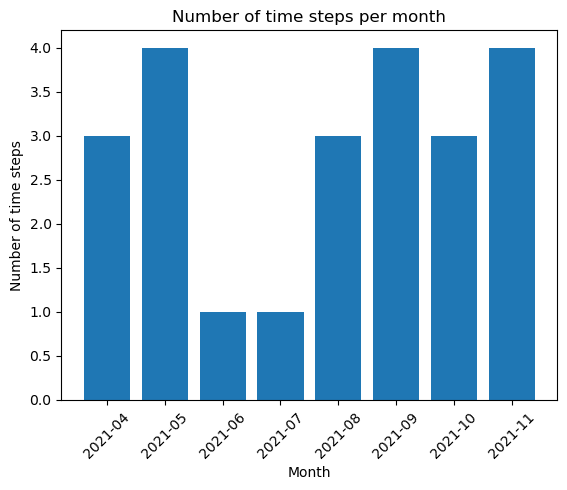

In [63]:
# Construction of the histogram
list_of_times_str = [str(time) for time in list_of_times]
list_of_times_month = [time_str[0:7] for time_str in list_of_times_str]
month_counts = Counter(list_of_times_month)

# Histogram of the number of time steps per month
plt.bar(month_counts.keys(), month_counts.values())
plt.xticks(rotation=45)
plt.ylabel('Number of time steps')
plt.xlabel('Month')
plt.title('Number of time steps per month')
plt.show()

We only have one picture for June and one for July. It's not great, but for now, we only need to visualize the data, so no worries.

## Visualization of the pictures for one fixed time

We have 23 dates, we choose one in this preliminary analysis

In [64]:
time_to_plot = '2021-04-09'

### Blue band - Fixed time

Min: 0.0000
Max: 0.4168
Mean: 0.0327
Median: 0.0275
Variance: 0.0005


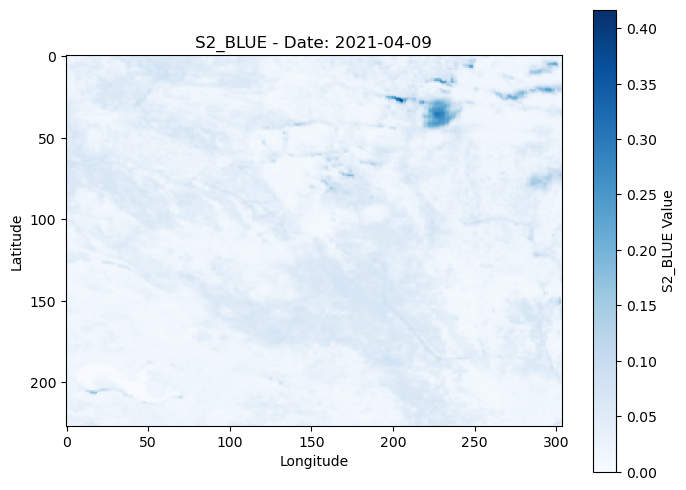

In [65]:
# Data selection of the Blue band
selected_data = datacube['S2_BLUE'].sel(time=time_to_plot)

# extract min, max, mean, median, variance, and standard deviation of the data
min_value = selected_data.min().values
max_value = selected_data.max().values
mean_value = selected_data.mean().values
median_value = np.median(selected_data.values)
variance_value = np.var(selected_data.values)
std_value = np.std(selected_data.values)

# Print the values and statistics 
print(f'Min: {min_value:.4f}')
print(f'Max: {max_value:.4f}')
print(f'Mean: {mean_value:.4f}')
print(f'Median: {median_value:.4f}')
print(f'Variance: {variance_value:.4f}')

# Plot of the data
plt.figure(figsize=(8, 6))
plt.imshow(selected_data, cmap='Blues')
plt.title(f'S2_BLUE - Date: {time_to_plot}')
plt.colorbar(label='S2_BLUE Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### Green band - Fixed time

Min: 0.0000
Max: 0.4038
Mean: 0.0512
Median: 0.0460
Variance: 0.0005


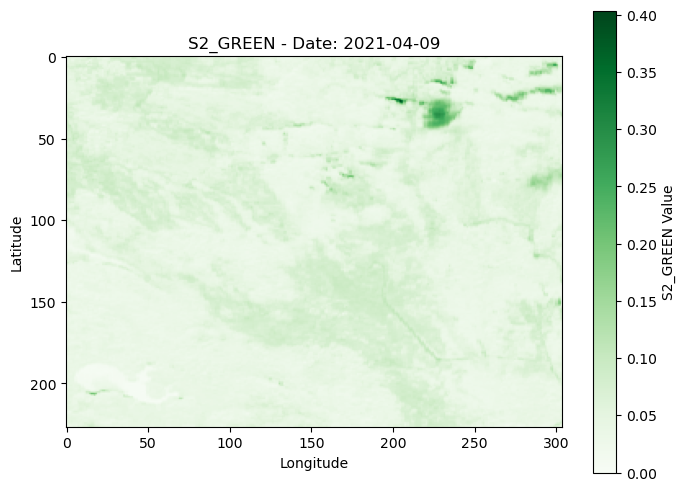

In [66]:
# Data selection of the Green band
selected_data = datacube['S2_GREEN'].sel(time=time_to_plot)

# extract min, max, mean, median, variance, and standard deviation of the data
min_value = selected_data.min().values
max_value = selected_data.max().values
mean_value = selected_data.mean().values
median_value = np.median(selected_data.values)
variance_value = np.var(selected_data.values)
std_value = np.std(selected_data.values)

# Print the values and statistics
print(f'Min: {min_value:.4f}')
print(f'Max: {max_value:.4f}')
print(f'Mean: {mean_value:.4f}')
print(f'Median: {median_value:.4f}')
print(f'Variance: {variance_value:.4f}')

# Plot of the data
plt.figure(figsize=(8, 6))
plt.imshow(selected_data, cmap='Greens')
plt.title(f'S2_GREEN - Date: {time_to_plot}')
plt.colorbar(label='S2_GREEN Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### Red band - Fixed time

Min: 0.0000
Max: 0.4156
Mean: 0.0624
Median: 0.0526
Variance: 0.0014


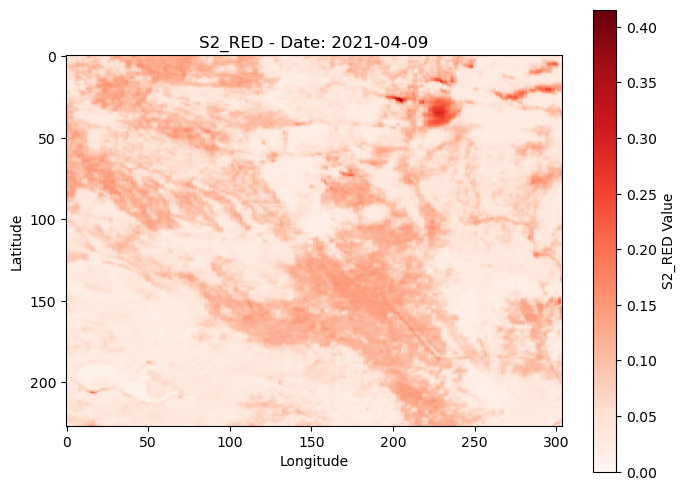

In [67]:
# Data selection of the red band
selected_data = datacube['S2_RED'].sel(time=time_to_plot)

# extract min, max, mean, median, variance, and standard deviation of the data
min_value = selected_data.min().values
max_value = selected_data.max().values
mean_value = selected_data.mean().values
median_value = np.median(selected_data.values)
variance_value = np.var(selected_data.values)
std_value = np.std(selected_data.values)

# Print the values and statistics
print(f'Min: {min_value:.4f}')
print(f'Max: {max_value:.4f}')
print(f'Mean: {mean_value:.4f}')
print(f'Median: {median_value:.4f}')
print(f'Variance: {variance_value:.4f}')

# Plot of the data
plt.figure(figsize=(8, 6))
plt.imshow(selected_data, cmap='Reds')
plt.title(f'S2_RED - Date: {time_to_plot}')
plt.colorbar(label='S2_RED Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


### NIR band - Fixed time

Min: 0.0000
Max: 0.4436
Mean: 0.2105
Median: 0.2083
Variance: 0.0018


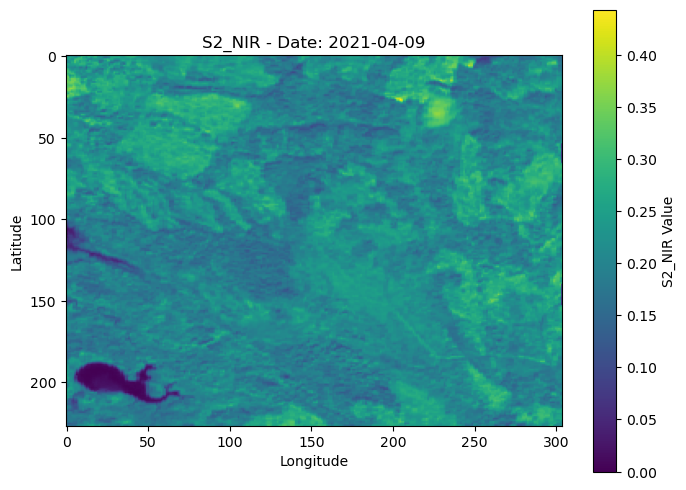

In [68]:
# Data selection of the NIR band
selected_data = datacube['S2_NIR'].sel(time=time_to_plot)

# extract min, max, mean, median, variance, and standard deviation of the data
min_value = selected_data.min().values
max_value = selected_data.max().values
mean_value = selected_data.mean().values
median_value = np.median(selected_data.values)
variance_value = np.var(selected_data.values)
std_value = np.std(selected_data.values)

# Print the values and statistics
print(f'Min: {min_value:.4f}')
print(f'Max: {max_value:.4f}')
print(f'Mean: {mean_value:.4f}')
print(f'Median: {median_value:.4f}')
print(f'Variance: {variance_value:.4f}')

# Plot of the data
plt.figure(figsize=(8, 6))
plt.imshow(selected_data, cmap='viridis') 
plt.title(f'S2_NIR - Date: {time_to_plot}')
plt.colorbar(label='S2_NIR Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### RGB - Fixed time

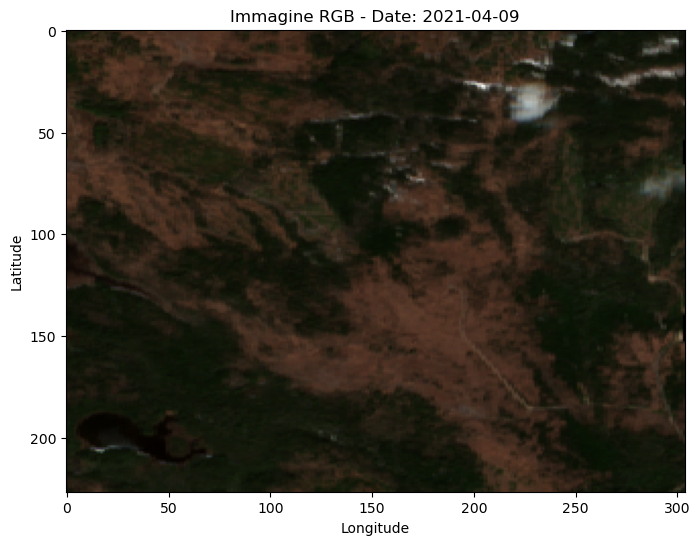

In [69]:
# select the bands to plot
red_band = datacube['S2_RED'].sel(time=time_to_plot)
green_band = datacube['S2_GREEN'].sel(time=time_to_plot)
blue_band = datacube['S2_BLUE'].sel(time=time_to_plot)

#  Normalization of the bands
red_normalized = (red_band - red_band.min()) / (red_band.max() - red_band.min())
green_normalized = (green_band - green_band.min()) / (green_band.max() - green_band.min())
blue_normalized = (blue_band - blue_band.min()) / (blue_band.max() - blue_band.min())

# Create the RGB image
rgb_image = np.dstack((red_normalized, green_normalized, blue_normalized))

# Plot the RGB image
plt.figure(figsize=(8, 6))
plt.imshow(rgb_image)
plt.title(f'Immagine RGB - Date: {time_to_plot}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

## Evolution over time of blue, green, red, nir bands and rgb picture

GIF saved as: evolution.gif


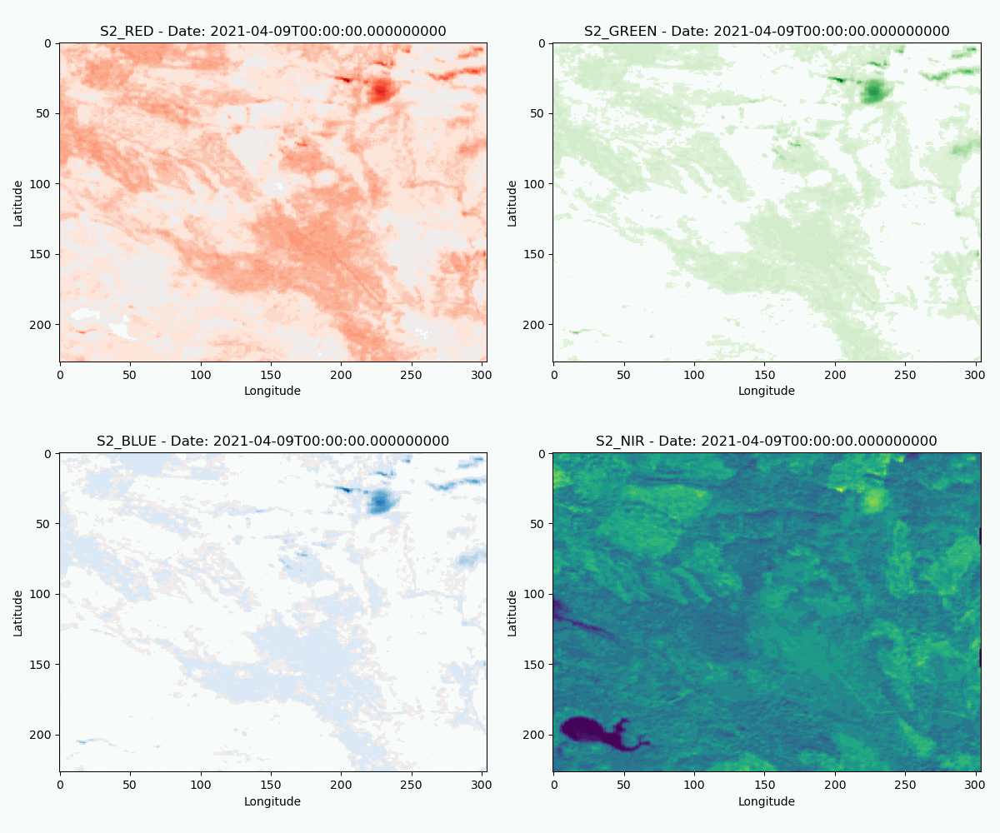

In [70]:
# list of time steps
time_list = list(map(str, datacube.time.values))

# gif path
gif_path = 'evolution.gif'

def plot_and_save_frame(tempo, path):
    time_data = datacube.sel(time=tempo)
    
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    axs[0, 0].imshow(time_data['S2_RED'], cmap='Reds')
    axs[0, 0].set_title(f'S2_RED - Date: {tempo}')
    axs[0, 0].set_xlabel('Longitude')
    axs[0, 0].set_ylabel('Latitude')
    
    axs[0, 1].imshow(time_data['S2_GREEN'], cmap='Greens')
    axs[0, 1].set_title(f'S2_GREEN - Date: {tempo}')
    axs[0, 1].set_xlabel('Longitude')
    axs[0, 1].set_ylabel('Latitude')
    
    axs[1, 0].imshow(time_data['S2_BLUE'], cmap='Blues')
    axs[1, 0].set_title(f'S2_BLUE - Date: {tempo}')
    axs[1, 0].set_xlabel('Longitude')
    axs[1, 0].set_ylabel('Latitude')
    
    axs[1, 1].imshow(time_data['S2_NIR'], cmap='viridis')
    axs[1, 1].set_title(f'S2_NIR - Date: {tempo}')
    axs[1, 1].set_xlabel('Longitude')
    axs[1, 1].set_ylabel('Latitude')
    
    plt.tight_layout()
    
    # Saving the frame as an image
    fig.savefig(path)
    plt.close(fig)

# Frame creation
frames = []
for tempo in time_list:
    frame_path = f'frame_{tempo}.png'
    plot_and_save_frame(tempo, frame_path)
    frames.append(imageio.imread(frame_path))

# Saving the frames as a gif
imageio.mimsave(gif_path, frames, duration=1000)

# Deleting the frames from the folder
for tempo in time_list:
    frame_path = f'frame_{tempo}.png'
    os.remove(frame_path)

print(f'GIF saved as: {gif_path}')

# Visualization of the GIF
Image(filename=gif_path)

GIF saved as: evolution_rgb.gif


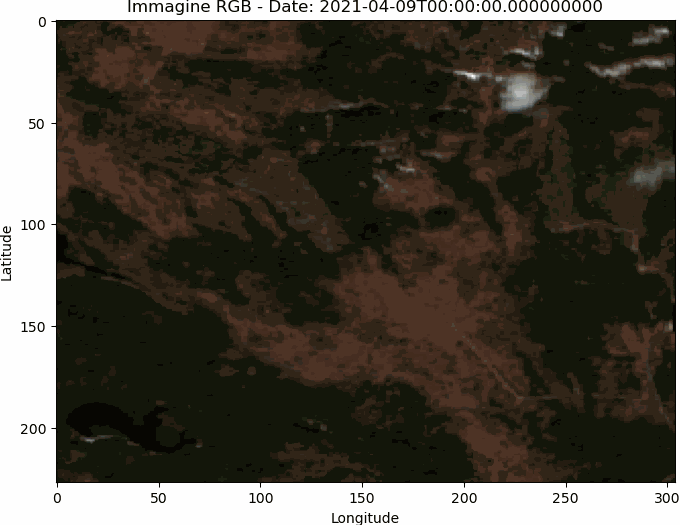

In [71]:
# List of time steps
time_list = list(map(str, datacube.time.values))

# GIF path
gif_rgb_path = 'evolution_rgb.gif'

def plot_rgb_and_save_frame(tempo, path):
    red_band = datacube['S2_RED'].sel(time=tempo)
    green_band = datacube['S2_GREEN'].sel(time=tempo)
    blue_band = datacube['S2_BLUE'].sel(time=tempo)

    # normalization of the bands
    red_normalized = (red_band - red_band.min()) / (red_band.max() - red_band.min())
    green_normalized = (green_band - green_band.min()) / (green_band.max() - green_band.min())
    blue_normalized = (blue_band - blue_band.min()) / (blue_band.max() - blue_band.min())

    # Create the RGB image
    rgb_image = np.dstack((red_normalized, green_normalized, blue_normalized))

    # Plot the RGB image
    plt.figure(figsize=(8, 6))
    plt.imshow(rgb_image)
    plt.title(f'Immagine RGB - Date: {tempo}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    #plt.axis('off')

    # Saving the frame as an image
    plt.savefig(path, bbox_inches='tight', pad_inches=0)
    plt.close()

# Creation of the frames
frames_rgb = []
for tempo in time_list:
    frame_rgb_path = f'frame_rgb_{tempo}.png'
    plot_rgb_and_save_frame(tempo, frame_rgb_path)
    frames_rgb.append(imageio.imread(frame_rgb_path))

# Saving the frames as a GIF
imageio.mimsave(gif_rgb_path, frames_rgb, duration=1000)  

# Deleting the frames from the folder
for tempo in time_list:
    frame_rgb_path = f'frame_rgb_{tempo}.png'
    os.remove(frame_rgb_path)

print(f'GIF saved as: {gif_rgb_path}')

# Visualization of the GIF
Image(filename=gif_rgb_path)


## Normalized Difference Vegetation Index (NDVI) - Visualization

The Normalized Difference Vegetation Index is defined as: NDVI = (NIR - Red) / (NIR + Red). It ranges between -1 and 1 because the Red and NIR values range between 0 and 1. Example of NDVI values are: forest 0.6 to 0.9; healty vegetation 0.2 to 0.6; soil (almost no vegetation) 0.1 to 0.2; water -1 to -0.9. 
We're going to observe how NDVI changes over time, and it varies significantly from one season to another. Spring marks the growing season, during which NDVI increases as vegetation flourishes. However, in autumn and winter, NDVI decreases as vegetation loses leaves and becomes sparser. 

In [72]:
# NDVI calculation
NDVI = (datacube['S2_NIR'] - datacube['S2_RED']) / (datacube['S2_NIR'] + datacube['S2_RED'])

# adding the NDVI to the Datacube
datacube['NDVI'] = NDVI

# Visualization of the Datacube
print(datacube)

<xarray.Dataset> Size: 32MB
Dimensions:   (time: 23, y: 227, x: 304)
Coordinates:
  * time      (time) datetime64[ns] 184B 2021-04-09 2021-04-14 ... 2021-11-25
  * y         (y) float32 908B 45.23 45.23 45.23 45.23 ... 45.21 45.21 45.21
  * x         (x) float32 1kB -69.95 -69.95 -69.95 ... -69.92 -69.92 -69.92
Data variables:
    S2_RED    (time, y, x) float32 6MB ...
    S2_GREEN  (time, y, x) float32 6MB ...
    S2_BLUE   (time, y, x) float32 6MB ...
    S2_NIR    (time, y, x) float32 6MB ...
    NDVI      (time, y, x) float32 6MB 0.6231 0.6231 0.6612 ... 0.8159 0.7271
Attributes:
    transform:        [ 8.98405270e-05  0.00000000e+00 -6.99499045e+01  0.000...
    crs:              +init=epsg:4326
    res:              [8.98405270e-05 9.04387077e-05]
    descriptions:     ['RED', 'GREEN', 'BLUE', 'NIR']
    AREA_OR_POINT:    Area
    _FillValue:       nan
    s2_data_lineage:  {"Data origin": "S3 bucket (ARN=arn:aws:s3:::sentinel-c...
    ulx, uly:         [-69.94990454  45.23320715

### NDVI visualization - Fixed time

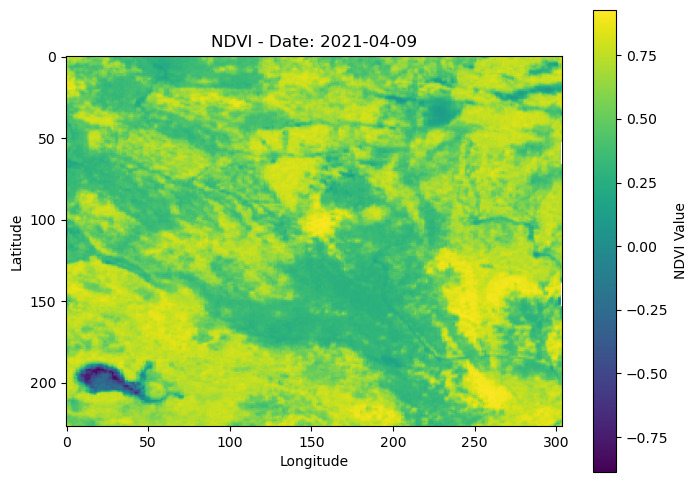

In [73]:
# Fix the same date as before
time_to_plot = '2021-04-09'

# select the NDVI data
ndvi_data = datacube['NDVI'].sel(time=time_to_plot)

# Plot of the NDVI data
plt.figure(figsize=(8, 6))
plt.imshow(ndvi_data, cmap='viridis') 
plt.title(f'NDVI - Date: {time_to_plot}')
plt.colorbar(label='NDVI Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### NDVI evolution over time

GIF saved as: evolution_ndvi.gif


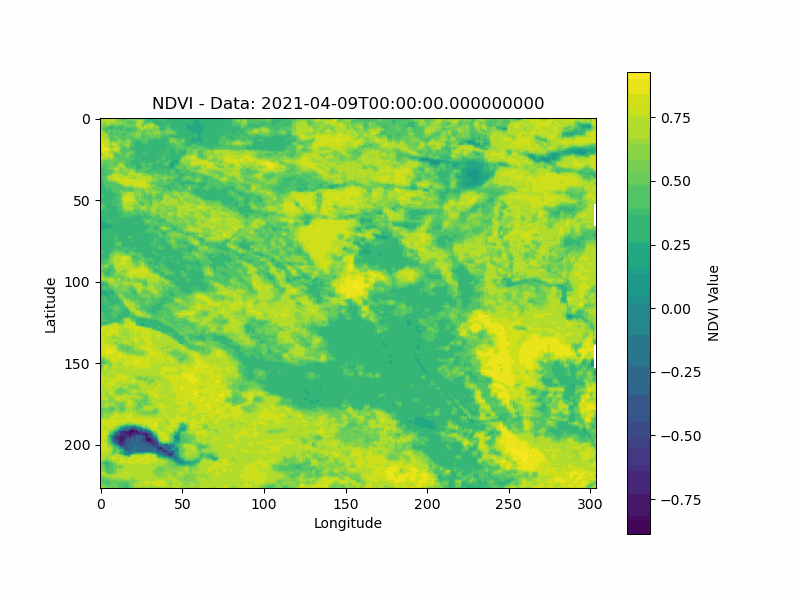

In [74]:
# list of time steps
time_list = list(map(str, datacube.time.values))

# GIF path
gif_ndvi_path = 'evolution_ndvi.gif'

def plot_ndvi_and_save_frame(tempo, path):
    ndvi_tempo = datacube['NDVI'].sel(time=tempo)
    
    plt.figure(figsize=(8, 6))
    plt.imshow(ndvi_tempo, cmap='viridis')  
    plt.title(f'NDVI - Data: {tempo}')
    plt.colorbar(label='NDVI Value')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    # Saving the frame as an image
    plt.savefig(path)
    plt.close()

# Creation of the frames
frames_ndvi = []
for tempo in time_list:
    frame_ndvi_path = f'frame_ndvi_{tempo}.png'
    plot_ndvi_and_save_frame(tempo, frame_ndvi_path)
    frames_ndvi.append(imageio.imread(frame_ndvi_path))

# Saving frames as GIF
imageio.mimsave(gif_ndvi_path, frames_ndvi, duration=1000) 

# Deleting the frames from the folder
for tempo in time_list:
    frame_ndvi_path = f'frame_ndvi_{tempo}.png'
    os.remove(frame_ndvi_path)

print(f'GIF saved as: {gif_ndvi_path}')

# Visualization of the GIF
Image(filename=gif_ndvi_path)


## NDVI - Time series Analysis

Spatial Distribution: By examining the NDVI values spatially across the study area, we can identify regions with different levels of vegetation density and health. Areas with higher NDVI values typically indicate denser and healthier vegetation, while lower NDVI values may indicate sparse vegetation or non-vegetated areas. Analyzing the spatial distribution of NDVI allows us to identify vegetation patterns, such as forested areas, agricultural lands, and urban areas.

Evolution Over Time: Monitoring the NDVI values over time provides insights into the seasonal dynamics and long-term trends of vegetation growth and health. Seasonal variations in NDVI reflect changes in vegetation activity due to factors like weather patterns, temperature, and precipitation. For example, increases in NDVI during spring and summer months may indicate the onset of growing seasons and enhanced vegetation growth, while decreases in NDVI during autumn and winter months may suggest vegetation senescence or reduced photosynthetic activity. Long-term trends in NDVI can reveal vegetation responses to climate change, land use practices, and environmental disturbances.

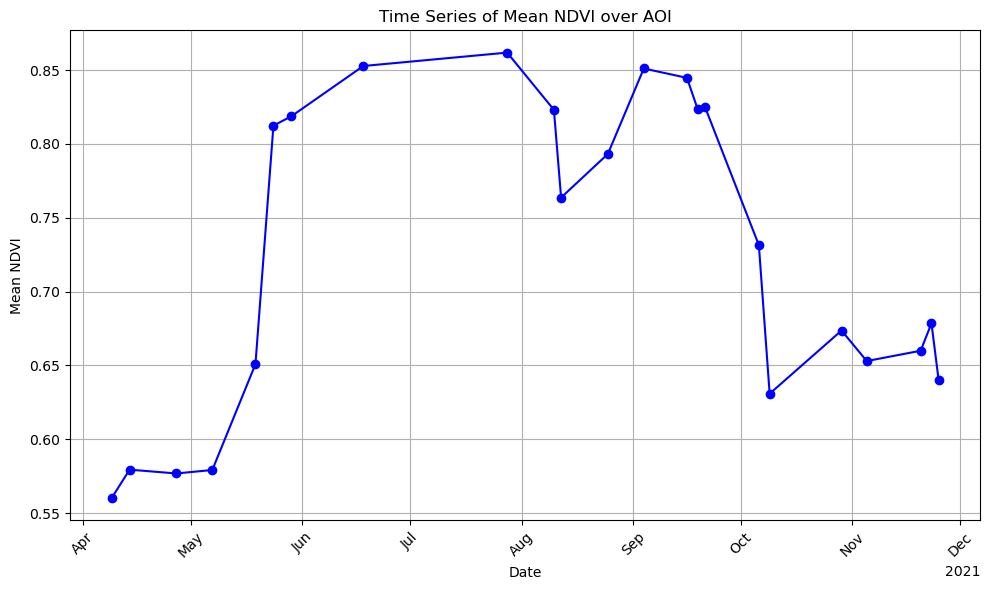

In [75]:
# NDVI mean over the AOI
ndvi_mean_over_aoi = datacube['NDVI'].mean(dim=('x', 'y'))

# Plot of the time series
plt.figure(figsize=(10, 6))
ndvi_mean_over_aoi.plot(marker='o', linestyle='-', color='b')
plt.title('Time Series of Mean NDVI over AOI')
plt.xlabel('Date')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


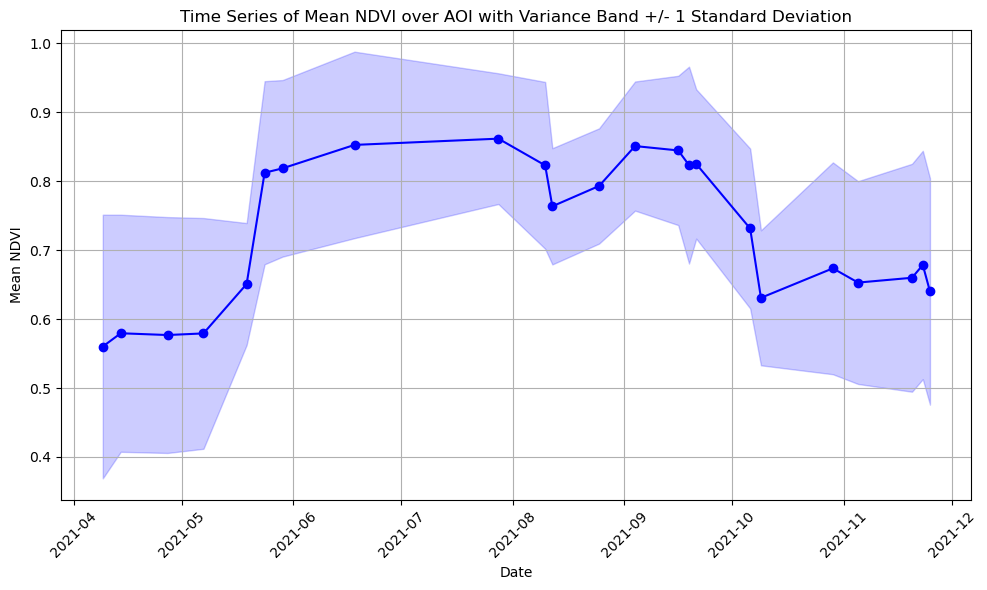

In [76]:
#Plot of the NDVI mean over the AOI with a variance band around it of +/- 1 standard deviation
ndvi_std_over_aoi = datacube['NDVI'].std(dim=('x', 'y'))

plt.figure(figsize=(10, 6))
plt.plot(ndvi_mean_over_aoi.time, ndvi_mean_over_aoi, marker='o', linestyle='-', color='b')
plt.fill_between(ndvi_mean_over_aoi.time, ndvi_mean_over_aoi - ndvi_std_over_aoi, ndvi_mean_over_aoi + ndvi_std_over_aoi, color='b', alpha=0.2)
plt.title('Time Series of Mean NDVI over AOI with Variance Band +/- 1 Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Histogram of NDVI

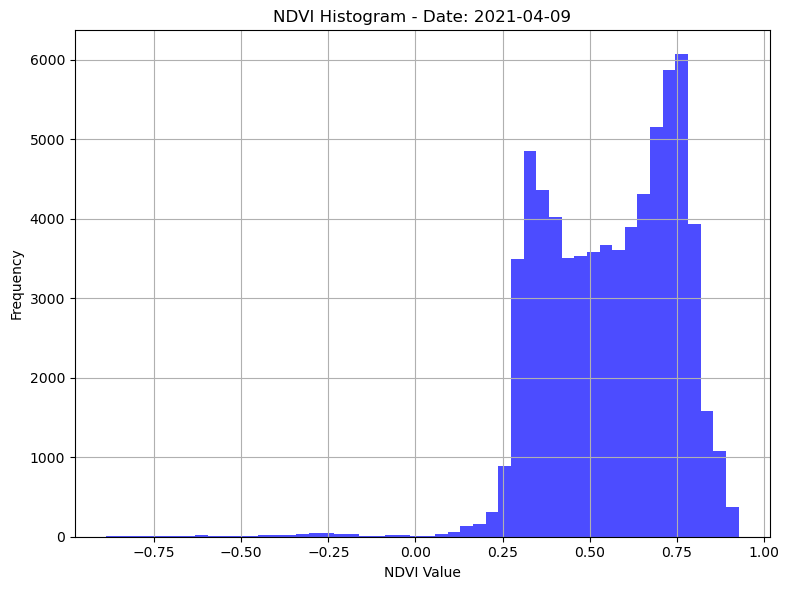

In [77]:
# time to plot
time_to_plot = '2021-04-09'

# select the NDVI data
ndvi_data = datacube['NDVI'].sel(time=time_to_plot)

# Plot of the NDVI data
plt.figure(figsize=(8, 6))
plt.hist(ndvi_data.values.flatten(), bins=50, color='b', alpha=0.7)
plt.title(f'NDVI Histogram - Date: {time_to_plot}')
plt.xlabel('NDVI Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()


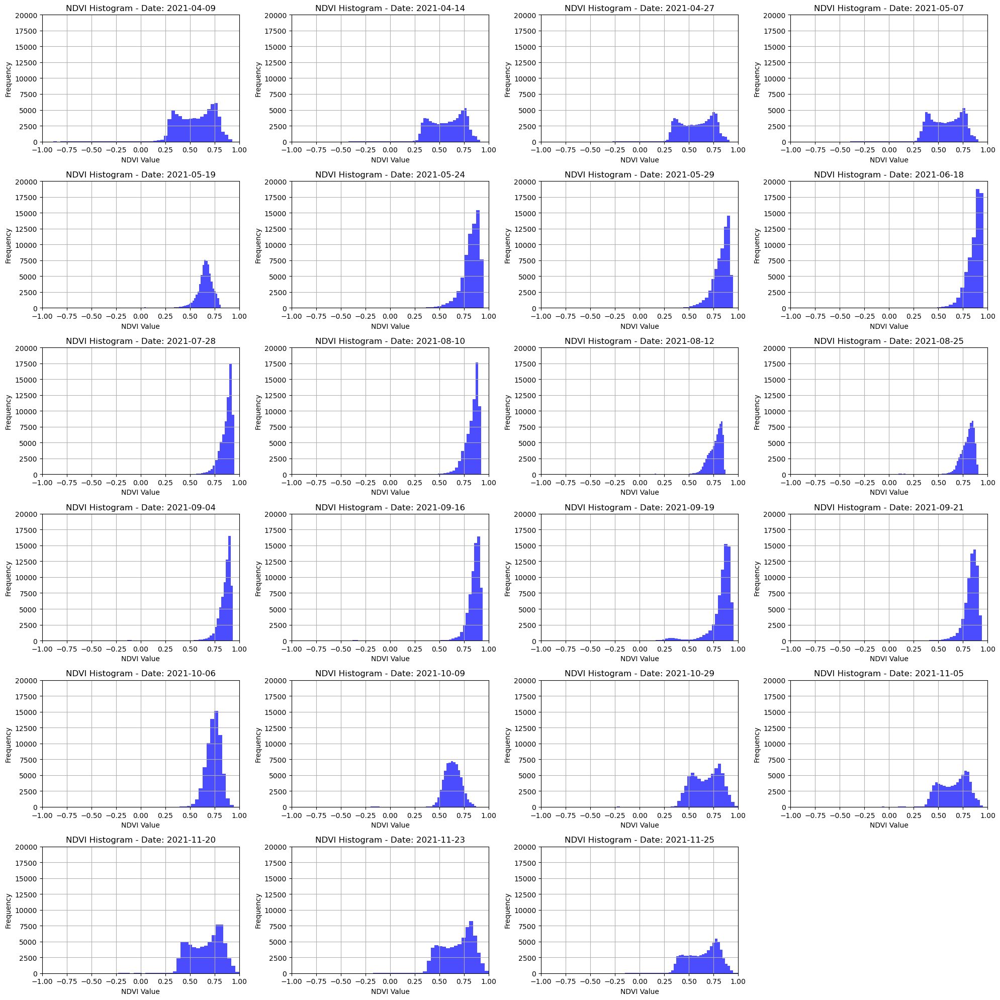

In [78]:
# Plot of the NDVI histogram for each time step
fig, axs = plt.subplots(6, 4, figsize=(20, 20))
axs = axs.ravel()

for i, time_step in enumerate(datacube.time.values):
    ndvi_data = datacube['NDVI'].sel(time=time_step)
    axs[i].hist(ndvi_data.values.flatten(), bins=50, color='b', alpha=0.7)
    time_step_only_date = str(time_step).split('T')[0]
    axs[i].set_title(f'NDVI Histogram - Date: {str(time_step_only_date)}')
    axs[i].set_xlabel('NDVI Value')
    axs[i].set_ylabel('Frequency')
    axs[i].grid(True)
    axs[i].set_ylim(0, 20000)
    axs[i].set_xlim(-1, 1)

# remove the empty subplots
for i in range(23, 24):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()

## Sub AOI - Visualization

In [79]:
# Load the sub-AOI polygon
sub_aoi = gpd.read_file('geospatial_sub_aoi.geojson')

#print the vertices of the polygon (rectangle) in analisys
print(sub_aoi.total_bounds) 

[-69.9489978   45.21690378 -69.9269649   45.23234486]


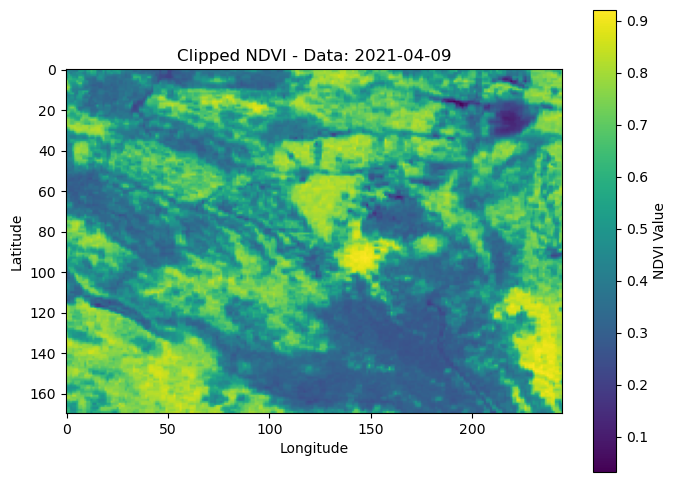

In [80]:
# Extract the bounding box coordinates of the sub-AOI
min_x, min_y, max_x, max_y = sub_aoi.total_bounds

# Clip the NDVI data to the extent of the sub-AOI
clipped_ndvi = datacube['NDVI'].sel(x=slice(min_x, max_x), y=slice(max_y, min_y))

# Plot the clipped NDVI data
plt.figure(figsize=(8, 6))
plt.imshow(clipped_ndvi.sel(time=time_to_plot), cmap='viridis')
plt.title(f'Clipped NDVI - Data: {time_to_plot}')
plt.colorbar(label='NDVI Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

## Grid over NDVI - what is happening on the 19th of September?

I noticed an unusual area in the top right corner on September 19th. Was it just a cloud, or perhaps smoke from a fire? Probably just a cloud but let's see.

I divide the AOI into a grid, and for each rectangle, I calculate the mean value as representative of that rectangle. Then, I plot the time series of the resulting pictures.

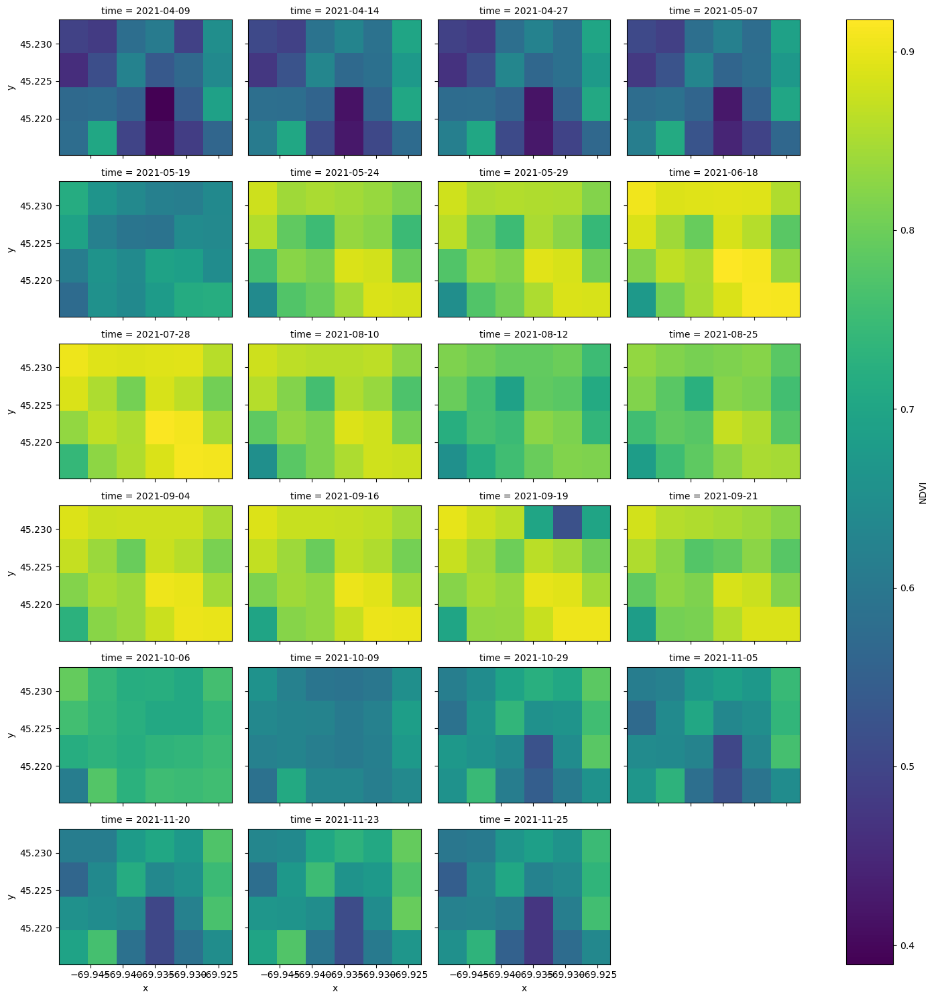

In [81]:
# take one NDVI image not clipped
ndvi_data = datacube['NDVI']

# Subdivide the ndvi_data into a pixels grid 
n = 50 # square grid of n x n pixels 
ndvi_data_grid = ndvi_data.coarsen(x=n, y=n, boundary='trim').mean()

# Plot the grid pixels NDVI data with a slider for the time steps
ndvi_data_grid.plot.imshow(x='x', y='y', col='time', cmap='viridis', col_wrap=4, figsize=(15, 15))
plt.show()


We can clearly observe that from September 16th to 19th, the pixel in the top right corner transitions from blue to yellow. I want to see the time series all togheder.

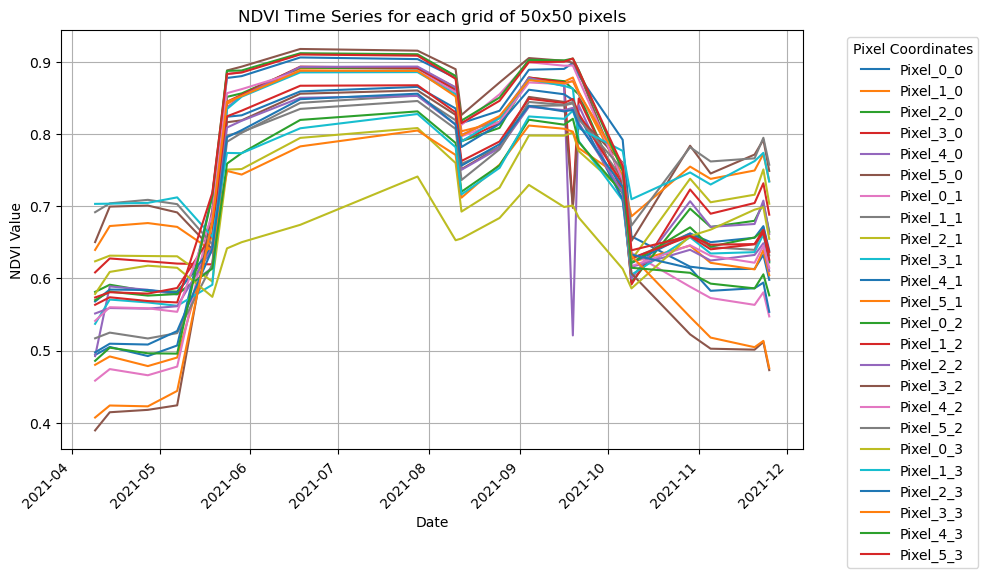

In [82]:
# Reshape the data array to have time as the first dimension
reshaped_ndvi_data = ndvi_data_grid.values.reshape(ndvi_data_grid.shape[0], -1)

# Get the x and y dimensions
x_dim = ndvi_data_grid.sizes['x']
y_dim = ndvi_data_grid.sizes['y']

# Create index for the DataFrame
time_index = pd.to_datetime(ndvi_data_grid.time.values)

# Initialize a list to store the DataFrames for each pixel
dfs = []

# Iterate over each pixel and extract its time series
for i in range(reshaped_ndvi_data.shape[1]):
    pixel_values = reshaped_ndvi_data[:, i]
    x_coord = i % x_dim  # Calculate x coordinate
    y_coord = i // x_dim  # Calculate y coordinate
    df = pd.DataFrame(pixel_values, index=time_index, columns=[f'Pixel_{x_coord}_{y_coord}'])
    dfs.append(df)

# Concatenate all DataFrames along columns axis
pixel_time_series = pd.concat(dfs, axis=1)

# Plot all the time series on the same plot
plt.figure(figsize=(10, 6))
pixel_time_series.plot(ax=plt.gca(), legend=False)
plt.title('NDVI Time Series for each grid of {}x{} pixels'.format(n, n))
plt.xlabel('Date')
plt.ylabel('NDVI Value')
plt.legend(title='Pixel Coordinates', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Only that particular pixel exhibits a spike; all other time series behave normally. The smaller spikes near the violet one correspond to the pixel near the darker shift. However, upon examining the RGB picture, it becomes evident that it was merely a cloud.

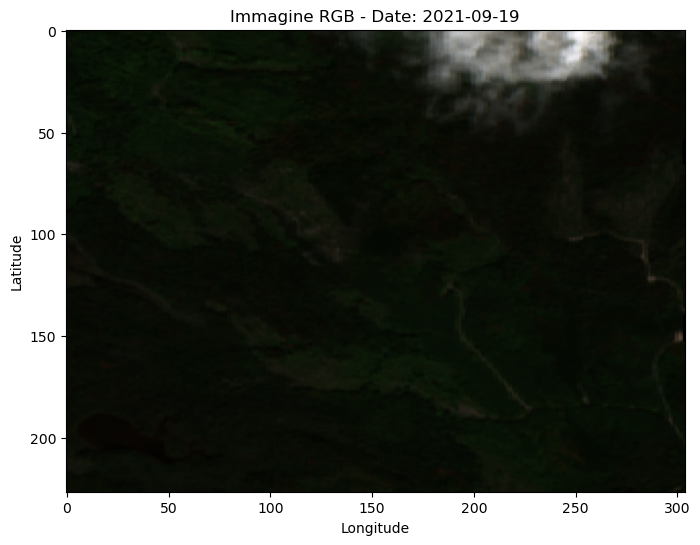

In [83]:
# plot the rbg image of the day 19th of September 2021
time_to_plot = '2021-09-19'

# select the bands to plot
red_band = datacube['S2_RED'].sel(time=time_to_plot)
green_band = datacube['S2_GREEN'].sel(time=time_to_plot)
blue_band = datacube['S2_BLUE'].sel(time=time_to_plot)

#  Normalization of the bands
red_normalized = (red_band - red_band.min()) / (red_band.max() - red_band.min())
green_normalized = (green_band - green_band.min()) / (green_band.max() - green_band.min())
blue_normalized = (blue_band - blue_band.min()) / (blue_band.max() - blue_band.min())

# Create the RGB image
rgb_image = np.dstack((red_normalized, green_normalized, blue_normalized))

# Plot the RGB image
plt.figure(figsize=(8, 6))
plt.imshow(rgb_image)
plt.title(f'Immagine RGB - Date: {time_to_plot}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

## What's Next with Satellite Data?

Our data was a lot sparse, we used sometimes 1 picture per month like in june and july. If we could have one picture per day any analysis would be much more accurate. What can we do with satellite data? Some ideas are:
- health check of forests, parks, glaciers, beaches, coral reefs
- operativity of a city: monitoring traffic jam 
- agricoltural check of crops (how is that crop going? we can check ndvi every day and have a global feedback)
- fire forecast: Check for arid soil and use today's weather forecast to predict future fire probability. An idea is to see the time series of places where it actually happened a fire and use those patterns to spot future fire places before they happen
- monitor volcano activities and rift activities to predict earthquakes